Import Libraries, mount Google Drive

# Import Libraries and Dataset

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import scipy
import sklearn
import regex
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [3]:
file_path = "/content/drive/My Drive/scMachine_Learning/Aggr_sol_dataset/Data/aggr_sol_dataset.csv"
# replace with your specific path after "My Drive" as applicable

df_aggr_sol = pd.read_csv(file_path)
df_aggr_sol.head()

,Gene,Gene_name,Uniprot_ID,isoelectric_point_x,set,solubility,max_NX,LHPpred,length,hydr_count,...,Methylation_MSD,coiled_coil,EGF,RAS_profile,RRM,ww_domain,transmembrane,TMHMM,Polar_exposed,Hydrophobic_exposed
0,ENSG00000000419,DPM1,O60762,10.018646,soluble,-0.046652,54.0,1719.856274,8.022368,0.407692,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.563636,0.200000
1,ENSG00000001036,FUCA2,Q9BTY2,6.195928,soluble,0.238562,40.7,1719.856274,8.867279,0.436831,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.627586,0.172414
2,ENSG00000001084,GCLC,P48506,5.980819,soluble,0.136042,32.4,882.618646,9.315150,0.401884,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.711957,0.086957
3,ENSG00000001497,LAS1L,Q9Y4W2,4.359482,aggregator,-0.898631,38.3,1015.981143,9.519636,0.374659,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.617284,0.143210
4,ENSG00000002549,LAP3,P28838,8.054211,soluble,0.230621,43.9,1247.199980,9.019591,0.433526,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.662338,0.162338


# Exploratory Data Analysis

Summary statistics:

In [ ]:
df_aggr_sol.describe()

,isoelectric_point_x,solubility,max_NX,LHPpred,length,hydr_count,polar_count,molecular_weight,helix,turn,...,Methylation_MSD,coiled_coil,EGF,RAS_profile,RRM,ww_domain,transmembrane,TMHMM,Polar_exposed,Hydrophobic_exposed
count,4421.000000,4421.000000,4421.000000,4420.000000,4420.000000,4420.000000,4420.000000,4420.000000,4420.000000,4420.000000,...,4420.000000,4420.000000,4420.000000,4420.000000,4420.000000,4420.000000,4420.000000,4420.000000,4420.000000,4420.000000
mean,7.071206,-0.046412,48.488984,1463.773146,8.923491,0.393923,0.411201,15.944015,0.352191,0.511992,...,0.373303,0.100452,0.003394,0.009729,0.027602,0.006109,0.182805,0.117421,0.590681,0.178819
std,1.812536,0.294344,56.697891,1071.097195,1.029043,0.056699,0.056718,1.026790,0.187658,0.158848,...,0.483736,0.300636,0.058163,0.098163,0.163848,0.077927,0.386551,0.321957,0.091909,0.066878
min,3.487224,-1.806241,0.000000,567.218959,5.459432,0.112150,0.204396,12.501840,0.000000,0.017606,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.244240,0.027778
25%,5.574759,-0.153183,24.100000,955.075030,8.251481,0.362298,0.377267,15.266758,0.218407,0.405694,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.530566,0.132075
50%,6.841744,0.021669,34.900000,1247.199980,8.891784,0.400786,0.408005,15.914534,0.335193,0.489011,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.600000,0.168178
75%,8.383252,0.145704,53.100000,1400.210385,9.592457,0.430856,0.441948,16.613147,0.464059,0.601685,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.658070,0.212598
max,12.740988,0.935928,1149.400000,6773.703428,13.102796,0.592437,0.676471,20.157455,0.982394,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.833333,0.531250


(array([  38.,  560., 2000., 1425.,  312.,   58.,   11.,    8.,    3.,
           5.]),
 array([  8.43373494,  21.9341679 ,  35.43460086,  48.93503381,
         62.43546677,  75.93589973,  89.43633269, 102.93676564,
        116.4371986 , 129.93763156, 143.43806452]),
 <BarContainer object of 10 artists>)

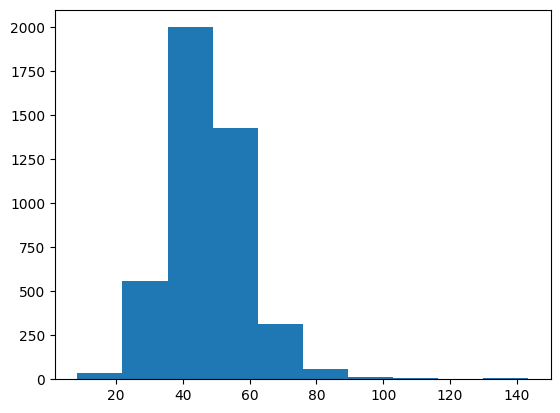

In [4]:
#df_aggr_sol['SUMOylation_all']
plt.hist(df_aggr_sol['Instability_index'])
#plt.scatter(df_aggr_sol['disorder'],df_aggr_sol['turn'])


Check for missing values:

In [5]:
df_aggr_sol.isnull().sum()

Gene                   0
Gene_name              0
Uniprot_ID             0
isoelectric_point_x    0
set                    0
                      ..
ww_domain              1
transmembrane          1
TMHMM                  1
Polar_exposed          1
Hydrophobic_exposed    1
Length: 101, dtype: int64

In [6]:
for i in range(df_aggr_sol.shape[1]):
    null_indices = df_aggr_sol.iloc[:, i].isnull()
    if null_indices.any():
        print("Column", i)
        print(df_aggr_sol[null_indices].iloc[:, i])


Column 7
2478   NaN
Name: LHPpred, dtype: float64
Column 8
2478   NaN
Name: length, dtype: float64
Column 9
2478   NaN
Name: hydr_count, dtype: float64
Column 10
2478   NaN
Name: polar_count, dtype: float64
Column 11
2478   NaN
Name: molecular_weight, dtype: float64
Column 12
2478   NaN
Name: helix, dtype: float64
Column 13
2478   NaN
Name: turn, dtype: float64
Column 14
2478   NaN
Name: sheet, dtype: float64
Column 15
2478   NaN
Name: A, dtype: float64
Column 16
2478   NaN
Name: C, dtype: float64
Column 17
2478   NaN
Name: D, dtype: float64
Column 18
2478   NaN
Name: E, dtype: float64
Column 19
2478   NaN
Name: F, dtype: float64
Column 20
2478   NaN
Name: G, dtype: float64
Column 21
2478   NaN
Name: H, dtype: float64
Column 22
2478   NaN
Name: I, dtype: float64
Column 23
2478   NaN
Name: K, dtype: float64
Column 24
2478   NaN
Name: L, dtype: float64
Column 25
2478   NaN
Name: M, dtype: float64
Column 26
2478   NaN
Name: N, dtype: float64
Column 27
2478   NaN
Name: P, dtype: float64
Co

In nearly every numeric column (indices 7-100), the entry identified by index 2478 contains NaN values and will be excluded.

In [7]:
df_aggr_sol = df_aggr_sol.drop(2478)

Check class (im)balance:

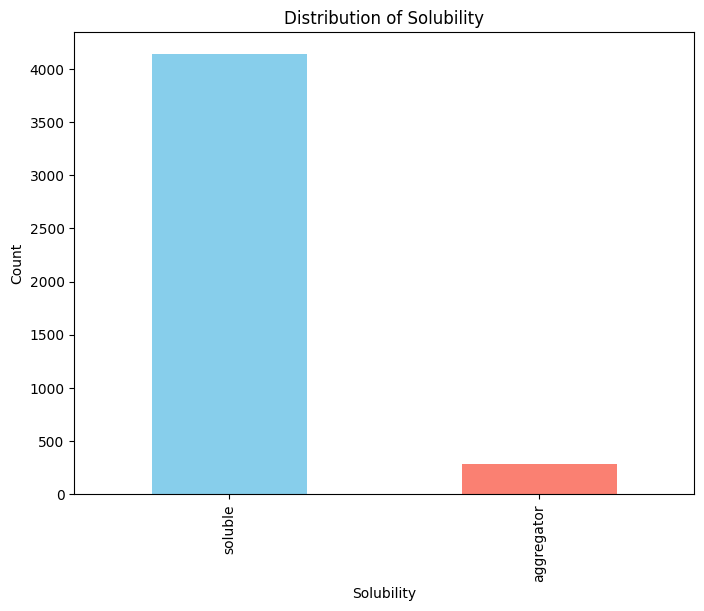

In [ ]:
plt.figure(figsize=(8, 6))
df_aggr_sol["set"].value_counts().plot(kind="bar", color=["skyblue", "salmon"])
plt.title("Distribution of Solubility")
plt.xlabel("Solubility")
plt.ylabel("Count")
plt.show()

In [ ]:
df_aggr_sol["set"].value_counts()

soluble       4141
aggregator     279
Name: set, dtype: int64

# Data Preprocessing, Feature Engineering

Add motif feature:

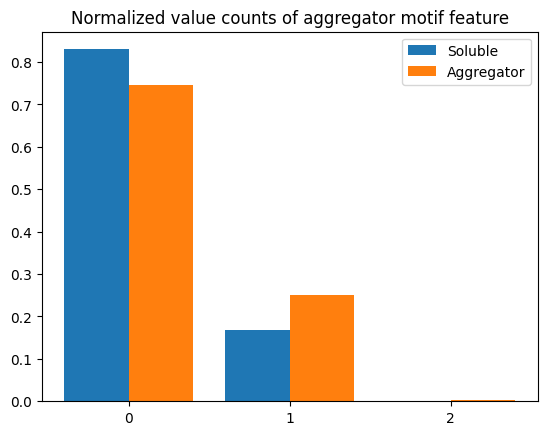

In [8]:
aggregator_motifs = [
    'Q'*11,  # Huntington's polyQ motif - https://doi.org/10.1016/j.bpj.2018.02.037
    'EAKL',  # PDZ recognition motif - https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3630890/
]
# Allow 1 AA error.
aggregator_patterns = [regex.compile(motif+'{e<=1}') for motif in aggregator_motifs]

def n_aggregator_motifs(sequence):
    sequence = str(sequence)
    n_motifs = 0
    for pattern in aggregator_patterns:
        n_motifs += 1 if (len(pattern.findall(sequence)) > 0) else 0
    return n_motifs

# Add feature to dataframe.
df_aggr_sol['n_aggregator_motifs'] = df_aggr_sol['fasta_sequence'].apply(n_aggregator_motifs)

# Plotting
sol_motifs = df_aggr_sol[df_aggr_sol.set.isin(['soluble'])].n_aggregator_motifs.value_counts(normalize=True)
agg_motifs = df_aggr_sol[df_aggr_sol.set.isin(['aggregator'])].n_aggregator_motifs.value_counts(normalize=True)

plt.bar(np.arange(len(sol_motifs)) - 0.2, sol_motifs, 0.4, label='Soluble')
plt.bar(np.arange(len(agg_motifs)) + 0.2, agg_motifs, 0.4, label='Aggregator')
plt.xticks([0,1,2])
plt.legend()
plt.title('Normalized value counts of aggregator motif feature')
plt.show()

Select numeric columns:

In [9]:
non_numeric_columns = df_aggr_sol.select_dtypes(exclude=["number"]).columns
df_aggr_sol_n = df_aggr_sol.drop(["set", "solubility", "Gene", "Gene_name", "Uniprot_ID"] + list(non_numeric_columns), axis=1)
df_aggr_sol_n.head()

,isoelectric_point_x,max_NX,LHPpred,length,hydr_count,polar_count,molecular_weight,helix,turn,sheet,...,coiled_coil,EGF,RAS_profile,RRM,ww_domain,transmembrane,TMHMM,Polar_exposed,Hydrophobic_exposed,n_aggregator_motifs
0,10.018646,54.0,1719.856274,8.022368,0.407692,0.388462,15.065901,0.411538,0.411538,0.176923,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.563636,0.200000,0
1,6.195928,40.7,1719.856274,8.867279,0.436831,0.359743,15.930630,0.289079,0.552463,0.158458,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.627586,0.172414,0
2,5.980819,32.4,882.618646,9.315150,0.401884,0.422292,16.361890,0.398744,0.489796,0.111460,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.711957,0.086957,0
3,4.359482,38.3,1015.981143,9.519636,0.374659,0.430518,16.554720,0.403270,0.592643,0.004087,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.617284,0.143210,1
4,8.054211,43.9,1247.199980,9.019591,0.433526,0.371869,15.999111,0.391137,0.431599,0.177264,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.662338,0.162338,0


Standardization by mean-centering and scaling:

In [10]:
df_aggr_sol_n_c = df_aggr_sol_n.sub(df_aggr_sol_n.mean(axis=0), axis=1)
df_aggr_sol_n_cs = df_aggr_sol_n_c.div(df_aggr_sol_n_c.std(axis=0),axis=1)
df_aggr_sol_n_cs.head()

,isoelectric_point_x,max_NX,LHPpred,length,hydr_count,polar_count,molecular_weight,helix,turn,sheet,...,coiled_coil,EGF,RAS_profile,RRM,ww_domain,transmembrane,TMHMM,Polar_exposed,Hydrophobic_exposed,n_aggregator_motifs
0,1.625937,0.097089,0.239085,-0.875690,0.242856,-0.400927,-0.855203,0.316254,-0.632390,0.363117,...,-0.334133,-0.058348,-0.099105,-0.16846,-0.078388,-0.472915,-0.364709,-0.294261,0.316715,-0.457921
1,-0.482870,-0.137467,0.239085,-0.054626,0.756768,-0.907263,-0.013035,-0.336312,0.254773,0.200006,...,2.992145,-0.058348,-0.099105,-0.16846,-0.078388,2.114069,-0.364709,0.401537,-0.095772,-0.457921
2,-0.601535,-0.283843,-0.542579,0.380605,0.140413,0.195537,0.406972,0.248075,-0.139734,-0.215159,...,-0.334133,-0.058348,-0.099105,-0.16846,-0.078388,-0.472915,-0.364709,1.319516,-1.373585,-0.457921
3,-1.495948,-0.179792,-0.418069,0.579320,-0.339741,0.340565,0.594771,0.272191,0.507723,-1.163650,...,-0.334133,-0.058348,-0.099105,-0.16846,-0.078388,-0.472915,-0.364709,0.289444,-0.532448,2.130330
4,0.542254,-0.081032,-0.202197,0.093388,0.698481,-0.693471,0.053659,0.207536,-0.506101,0.366129,...,-0.334133,-0.058348,-0.099105,-0.16846,-0.078388,-0.472915,-0.364709,0.779645,-0.246437,-0.457921


In [11]:
# AA fractions are in columns 10-29, exposed AA fractions in columns 34-53

df_aggr_sol_rsq = pd.DataFrame(index=range(df_aggr_sol_n_cs.shape[1]), columns=range(df_aggr_sol_n_cs.shape[1]))

for i in range(df_aggr_sol_n_cs.shape[1]):
  for j in range(df_aggr_sol_n_cs.shape[1]):
    x = df_aggr_sol_n_cs.iloc[:,i]
    y = df_aggr_sol_n_cs.iloc[:,j]
    pearson_corr, _ = pearsonr(x, y)
    r_squared = pearson_corr ** 2
    df_aggr_sol_rsq[i][j] = r_squared




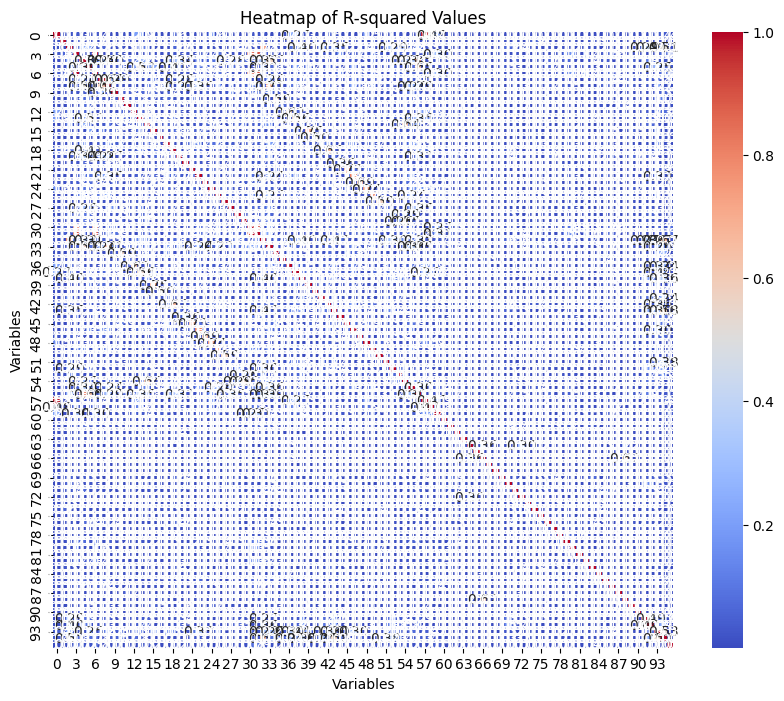

In [12]:
# Convert DataFrame values to numeric type
df_aggr_sol_rsq = df_aggr_sol_rsq.apply(pd.to_numeric)

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df_aggr_sol_rsq, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap of R-squared Values")
plt.xlabel("Variables")
plt.ylabel("Variables")
plt.show()

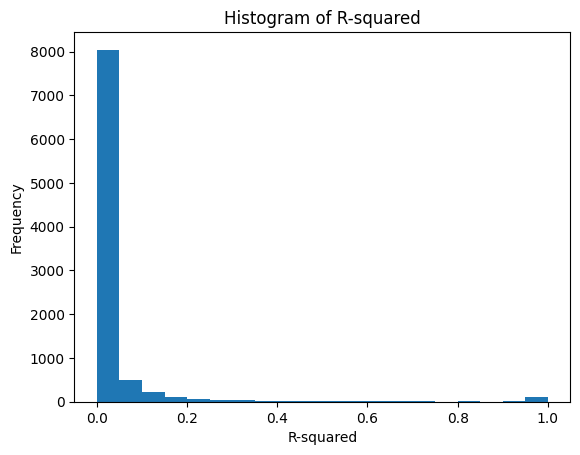

In [13]:
aux_len = df_aggr_sol_rsq.shape[0]*df_aggr_sol_rsq.shape[1]
list_aggr_sol_rsq = []
default_value = 0

for _ in range(aux_len):
    list_aggr_sol_rsq.append(default_value)

list_i = 0

for i in range(df_aggr_sol_rsq.shape[0]):
  for j in range(df_aggr_sol_rsq.shape[1]):
    list_aggr_sol_rsq[list_i] = df_aggr_sol_rsq[i][j]
    list_i += 1


# Create a histogram
plt.hist(list_aggr_sol_rsq, bins=20)

# Add labels and title
plt.xlabel("R-squared")
plt.ylabel("Frequency")
plt.title("Histogram of R-squared")

# Show the plot
plt.show()

Both the heatmap and the histogram show that most variables are not correlated between them. Naturally, the heatmap"s diagonal and the rightmost bin of the histogram show a number of perfect correlations for variables with themselves.

However, the histogram still presents some variables correlate with an R^2 > 0.8. Let"s look at them, excluding the perfect 1.00 correlations of variables with themselves and the near-perfect correlations of 0.95 or more.

Inspecting the near-perfect correlations, scoring 0.95 or higher:

In [14]:
for i in range(df_aggr_sol_rsq.shape[0]):
  for j in range(df_aggr_sol_rsq.shape[1]):
    if(df_aggr_sol_rsq[i][j] >= 0.95 and i!=j):
      print(df_aggr_sol_n_cs.columns[i],"\t",df_aggr_sol_n_cs.columns[j],"\t",df_aggr_sol_rsq[i][j])

isoelectric_point_x 	 isoelectric_point_y 	 0.9767380284090637
length 	 molecular_weight 	 0.9989291450585777
molecular_weight 	 length 	 0.9989291450585777
isoelectric_point_y 	 isoelectric_point_x 	 0.9767380284090637


We have now verified that:

*   Both coordinates of the **isoelectric point** correlate very highly (0.9767) to each other.
*   Sequence length and molecular weight score a near-perfect correlation (0.9989)

Any model we build should take into consideration that using either set of two features is redundant and will not provide additional information. We will therefore evaluate which one to keep when building our models.

Inspecting the variables that correlate highly (>= 0.80):

In [15]:
list_hicorr = []

for i in range(df_aggr_sol_rsq.shape[0]):
  for j in range(df_aggr_sol_rsq.shape[1]):
    if(0.8 <= df_aggr_sol_rsq[i][j] < 0.95 and i!=j):
      print(df_aggr_sol_n_cs.columns[i],"\t",df_aggr_sol_n_cs.columns[j],"\t",df_aggr_sol_rsq[i][j])
      list_hicorr.append(df_aggr_sol_n_cs.columns[i])


length 	 thsa_netsurfp2 	 0.8168940598590304
length 	 tasa_netsurfp2 	 0.9013538628568191
hydr_count 	 Gravy 	 0.8304225633268008
molecular_weight 	 thsa_netsurfp2 	 0.8123280109537903
molecular_weight 	 tasa_netsurfp2 	 0.9004092034224521
P 	 P_exposed 	 0.811668405137616
thsa_netsurfp2 	 length 	 0.8168940598590304
thsa_netsurfp2 	 molecular_weight 	 0.8123280109537903
thsa_netsurfp2 	 tasa_netsurfp2 	 0.9121228990901646
tasa_netsurfp2 	 length 	 0.9013538628568191
tasa_netsurfp2 	 molecular_weight 	 0.9004092034224521
tasa_netsurfp2 	 thsa_netsurfp2 	 0.9121228990901646
P_exposed 	 P 	 0.811668405137616
Gravy 	 hydr_count 	 0.8304225633268008


The highest correlations found (R^2 > 0.8) correspond to:


*   **THSA, TASA:** total hydrophobic (0.8168) and total accessible (0.9013) surface area, respectively, both correlate with sequence length (and therefore molecular weight) and to each other (0.9121).
*   **Hydrophobic residue count** highly correlates (0.8304) to the Gravy index.
*   Among all the aminoacids **Proline (P)** has the highest correlation (0.8116) between the fraction of its total residues and the fraction of its exposed residues, with respect to all residues.


In [16]:
list_hicorr = list(set(list_hicorr))
list_hicorr

['molecular_weight',
 'tasa_netsurfp2',
 'P',
 'hydr_count',
 'thsa_netsurfp2',
 'P_exposed',
 'length',
 'Gravy']

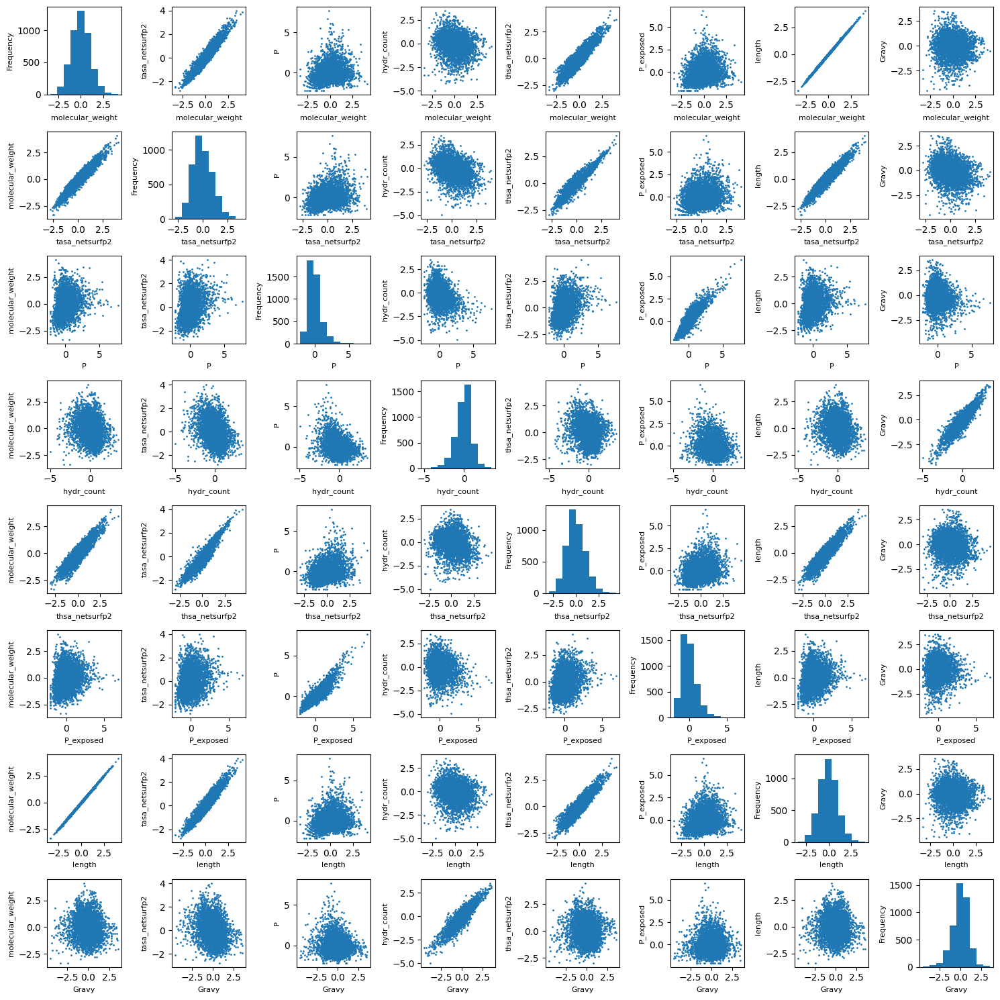

In [17]:

ncols = len(list_hicorr)
fig, axs = plt.subplots(ncols, ncols, figsize=(15, 15))

for i in range(ncols):
    for j in range(ncols):
        if i == j:
            axs[i, j].hist(df_aggr_sol_n_cs[list_hicorr[i]], bins=10)
            axs[i, j].set_xlabel(list_hicorr[i], fontsize=8)
            axs[i, j].set_ylabel("Frequency", fontsize=8)
        else:
            axs[i, j].scatter(df_aggr_sol_n_cs[list_hicorr[i]], df_aggr_sol_n_cs[list_hicorr[j]],s=1)
            axs[i, j].set_xlabel(list_hicorr[i], fontsize=8)
            axs[i, j].set_ylabel(list_hicorr[j], fontsize=8)

plt.tight_layout()
plt.show()

In [18]:
df_aggr_sol["length"]

0        8.022368
1        8.867279
2        9.315150
3        9.519636
4        9.019591
          ...    
4416     9.921841
4417     8.022368
4418    11.195987
4419     8.463524
4420     8.055282
Name: length, Length: 4420, dtype: float64

(array([2.246e+03, 1.382e+03, 4.680e+02, 1.510e+02, 7.500e+01, 4.400e+01,
        1.900e+01, 8.000e+00, 7.000e+00, 4.000e+00, 7.000e+00, 4.000e+00,
        2.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00]),
 array([  44.  ,  481.65,  919.3 , 1356.95, 1794.6 , 2232.25, 2669.9 ,
        3107.55, 3545.2 , 3982.85, 4420.5 , 4858.15, 5295.8 , 5733.45,
        6171.1 , 6608.75, 7046.4 , 7484.05, 7921.7 , 8359.35, 8797.  ]),
 <BarContainer object of 20 artists>)

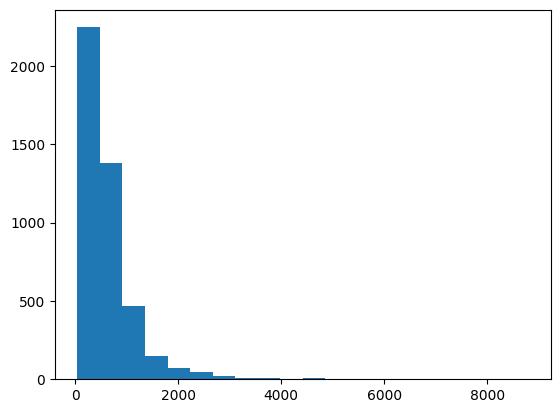

In [19]:
plt.hist(df_aggr_sol["fasta_sequence"].str.len(),bins=20)

(array([  3.,   6.,  29.,  83., 146., 306., 386., 596., 672., 631., 557.,
        413., 282., 137.,  84.,  52.,  17.,  13.,   5.,   2.]),
 array([ 5.45943162,  5.84159983,  6.22376805,  6.60593626,  6.98810447,
         7.37027269,  7.7524409 ,  8.13460912,  8.51677733,  8.89894554,
         9.28111376,  9.66328197, 10.04545019, 10.4276184 , 10.80978661,
        11.19195483, 11.57412304, 11.95629125, 12.33845947, 12.72062768,
        13.1027959 ]),
 <BarContainer object of 20 artists>)

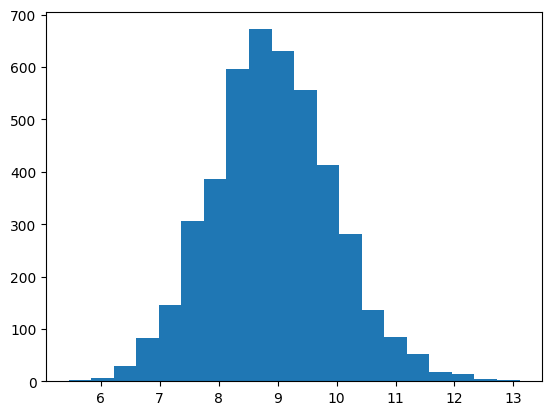

In [20]:
plt.hist(df_aggr_sol["length"],bins=20)

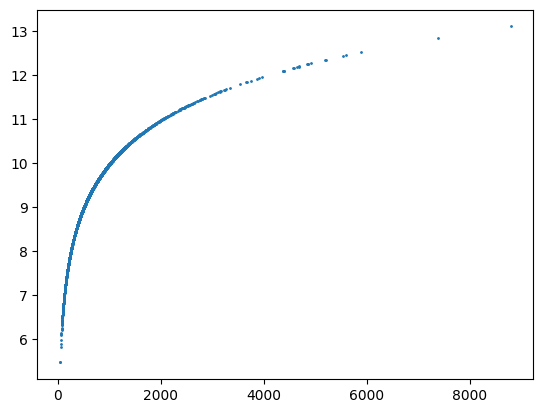

In [21]:
plt.scatter(df_aggr_sol["fasta_sequence"].str.len(),df_aggr_sol["length"],s=1)

In [33]:
#list_AAs = list(set(list_AAs))
#list_AAs
#df_aggr_sol_rsq
#list(df_aggr_sol_n.columns.values)
#10-29 34-53

aux_AAs_rsq_cols_A = df_aggr_sol_rsq.iloc[10:29:,34:53]
aux_AAs_rsq_cols_B = df_aggr_sol_rsq.iloc[34:53:,10:29]
aux_AAs_rsq_cols_A
aux_AAs_rsq_cols_B

,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28
34,5.856097e-01,0.009520,0.062265,0.003178,0.041066,0.015996,0.013742,1.234476e-01,0.013778,0.000167,0.021617,1.013156e-01,0.064171,4.238637e-03,0.005881,0.001856,3.987637e-03,0.001128,0.001512
35,2.294262e-07,0.070529,0.001401,0.000328,0.000076,0.000174,0.000015,1.988000e-03,0.004014,0.000918,0.004865,1.950538e-06,0.000091,9.225312e-04,0.002269,0.009357,1.625592e-03,0.000032,0.001463
36,5.171266e-02,0.008255,0.615652,0.004844,0.027760,0.024293,0.000353,6.130105e-02,0.001059,0.002181,0.005321,1.689693e-02,0.107805,2.457542e-02,0.031551,0.044641,4.269659e-03,0.005307,0.002728
37,2.269317e-02,0.000379,0.053976,0.560783,0.000401,0.106940,0.002204,1.116879e-02,0.031413,0.014790,0.000637,7.661881e-04,0.130816,4.003212e-04,0.008362,0.077726,2.401755e-02,0.002477,0.002767
38,7.371461e-04,0.004173,0.020988,0.031084,0.182598,0.008250,0.005698,7.419357e-03,0.004883,0.000400,0.007420,1.375699e-04,0.000579,2.139776e-02,0.000108,0.000045,7.024766e-04,0.001663,0.011532
39,2.401831e-02,0.000250,0.012933,0.070839,0.001426,0.746980,0.001755,3.699057e-02,0.069199,0.034573,0.005293,4.132281e-02,0.044723,1.810808e-02,0.006206,0.002610,6.089173e-03,0.000269,0.000776
40,9.995292e-03,0.008183,0.006406,0.027582,0.005077,0.003902,0.503512,1.907891e-03,0.026098,0.013712,0.000126,3.982839e-08,0.000370,9.399711e-04,0.000447,0.000196,3.674263e-04,0.003265,0.005998
41,1.572606e-02,0.002860,0.004529,0.000478,0.004670,0.010620,0.009534,9.535767e-02,0.012489,0.005914,0.006699,1.291778e-02,0.004679,4.981632e-04,0.008535,0.005612,1.748894e-02,0.002350,0.000682
42,3.083661e-02,0.000575,0.016749,0.017085,0.002312,0.057586,0.006657,1.202178e-01,0.672428,0.016287,0.014346,4.945143e-02,0.150938,3.563186e-02,0.055288,0.079243,7.501464e-04,0.002704,0.007639
43,1.004763e-02,0.002433,0.047433,0.004553,0.000488,0.000211,0.003702,1.986796e-02,0.022690,0.083192,0.002621,2.334863e-02,0.011087,1.481596e-03,0.002174,0.006310,9.106197e-08,0.000040,0.008937


Distribution of the data of the numerical features, still have to look at which test to use, I think the t-test may be used here. The data seems to be normally distributed.

# Preprocessing v2

In [ ]:
# load data
data = pd.read_csv(file_path)
data = data[data["Uniprot_ID"] != "A0A3B3IS91"]

# add new motif feature
aggregator_motifs = [
    'Q'*11,  # Huntington's polyQ motif - https://doi.org/10.1016/j.bpj.2018.02.037
    'EAKL',  # PDZ recognition motif - https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3630890/
]
# Allow 1 AA error.
aggregator_patterns = [regex.compile(motif+'{e<=1}') for motif in aggregator_motifs]

def n_aggregator_motifs(sequence):
    sequence = str(sequence)
    n_motifs = 0
    for pattern in aggregator_patterns:
        n_motifs += 1 if (len(pattern.findall(sequence)) > 0) else 0
    return n_motifs

# Add feature to dataframe.
data['n_aggregator_motifs'] = data['fasta_sequence'].apply(n_aggregator_motifs)

# only use the numerical features (also exclude the categorical features)
features = list(data.columns[6:])
features = features[:60] + features[-3:]
features.remove("fasta_sequence")
print(features)


['max_NX', 'LHPpred', 'length', 'hydr_count', 'polar_count', 'molecular_weight', 'helix', 'turn', 'sheet', 'A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y', 'thsa_netsurfp2', 'tasa_netsurfp2', 'rhsa_netsurfp2', 'disorder', 'A_exposed', 'C_exposed', 'D_exposed', 'E_exposed', 'F_exposed', 'G_exposed', 'H_exposed', 'I_exposed', 'K_exposed', 'L_exposed', 'M_exposed', 'N_exposed', 'P_exposed', 'Q_exposed', 'R_exposed', 'S_exposed', 'T_exposed', 'V_exposed', 'W_exposed', 'Y_exposed', 'Aromaticity', 'Instability_index', 'Gravy', 'isoelectric_point_y', 'charge_at_7', 'charge_at_5', 'Polar_exposed', 'Hydrophobic_exposed', 'n_aggregator_motifs']


In [ ]:
for feature in features:
    # test difference between groups
    data_sol = data[data["set"] == "soluble"][feature]
    data_aggr = data[data["set"] == "aggregator"][feature]

    U, p_value = scipy.stats.mannwhitneyu(data_sol, data_aggr)
    _, t_p_value = scipy.stats.ttest_ind(data_sol, data_aggr)

    # plotting
    plt.figure(figsize=(10, 6))
    sns.boxplot(x="set", y=feature, data=data, hue="set")
    plt.title(f"Distribution of {feature} by set (soluble / aggregator)\n Mann-Whitney U test = {p_value}, t_test = {t_p_value}")
    plt.show()

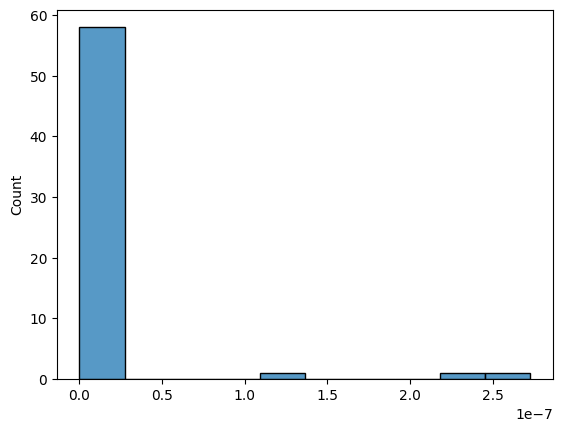

<Axes: ylabel='Count'>

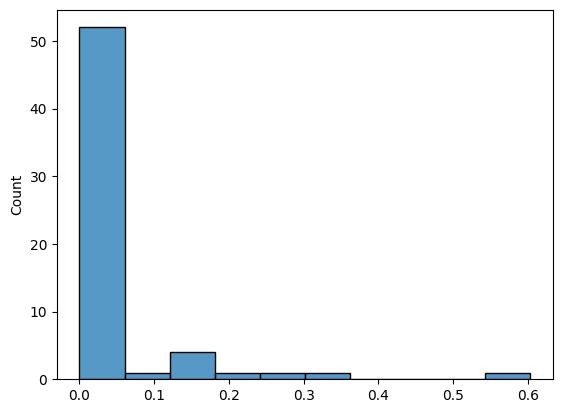

In [ ]:
# check for normality using Shapiro-Wilk
nor_verbose = False
normal_features_sol = {}
not_normal_features_sol = {}
normal_features_aggr = {}
not_normal_features_aggr = {}
p_list_sol = []
p_list_aggr = []

for feature in features:
    data_sol = data[data["set"] == "soluble"][feature]
    data_aggr = data[data["set"] == "aggregator"][feature]

    # Shapiro-Wilk test
    _, p_value_sol = scipy.stats.shapiro(data_sol)
    _, p_value_aggr = scipy.stats.shapiro(data_aggr)

    p_list_sol.append(p_value_sol)
    p_list_aggr.append(p_value_aggr)

    if nor_verbose:
        print(f"Normality test using Shapiro-Wilk for {feature}")
        print(f"p-value soluble = {p_value_sol}")
        print(f"p-value aggregator = {p_value_aggr}")

    # assign p-value to feature and in corresponding dict for soluble
    if p_value_sol < 0.05:
        normal_features_sol[feature] = p_value_sol
        if nor_verbose: print(f"The data for {feature} is not normally distributed for soluble.\n")
    else:
        not_normal_features_sol[feature] = p_value_sol
        if nor_verbose: print(f"The data for {feature} follows a normal distribution for soluble.\n")

    # assign p-value to feature and in corresponding dict for aggregator
    if p_value_aggr < 0.05:
        normal_features_aggr[feature] = p_value_aggr
        if nor_verbose: print(f"The data for {feature} is not normally distributed for aggregator.\n")
    else:
        not_normal_features_aggr[feature] = p_value_aggr
        if nor_verbose: print(f"The data for {feature} follows a normal distribution for aggregator.\n")

sns.histplot(p_list_sol, bins=10)
plt.show()
sns.histplot(p_list_aggr, bins=10)
# plt.plot(p_list_sol)

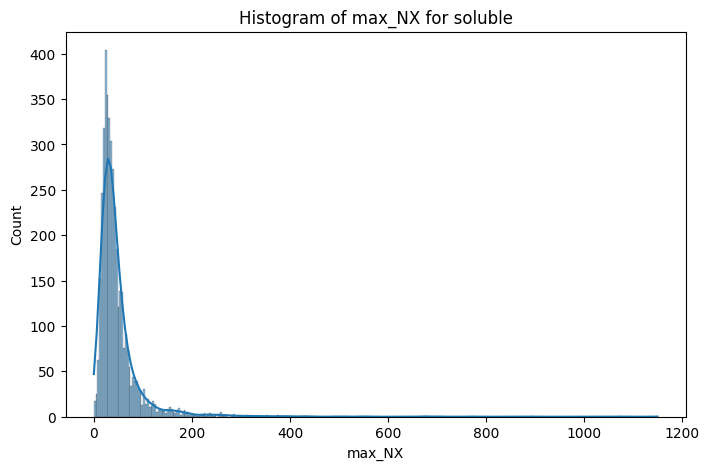

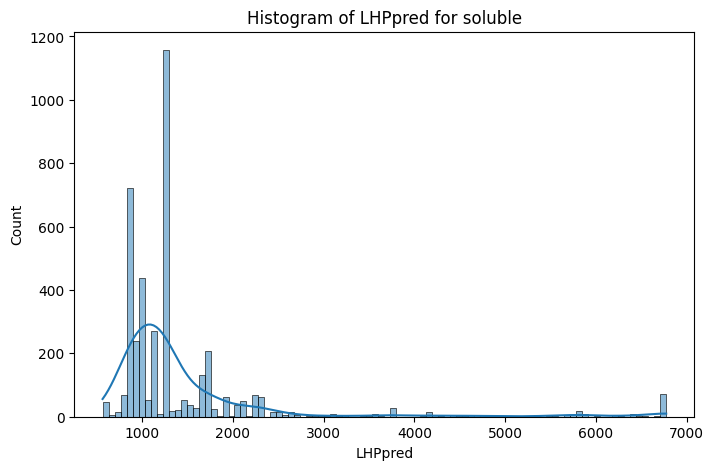

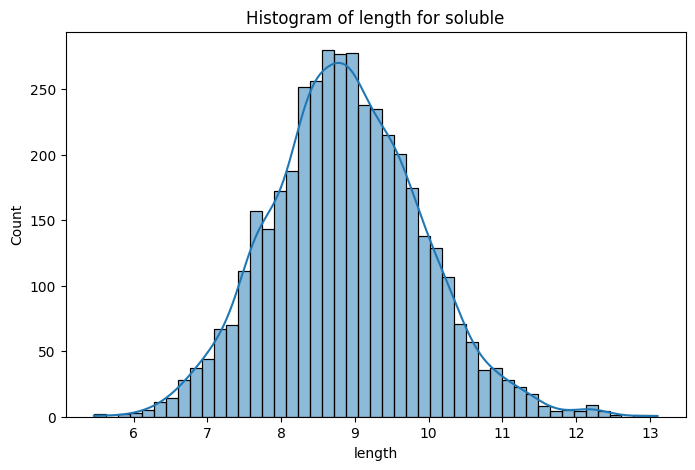

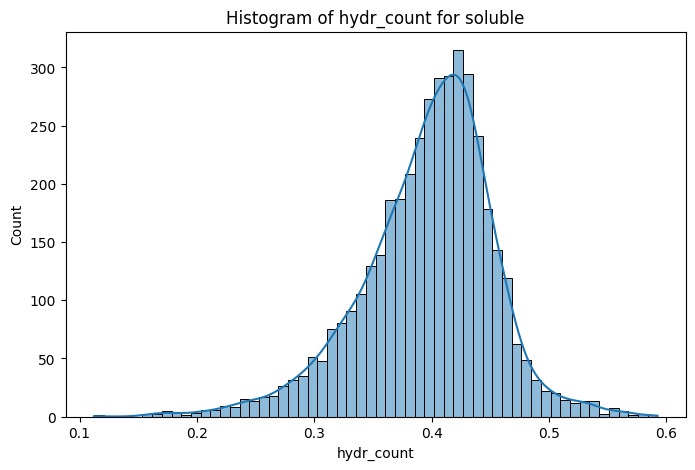

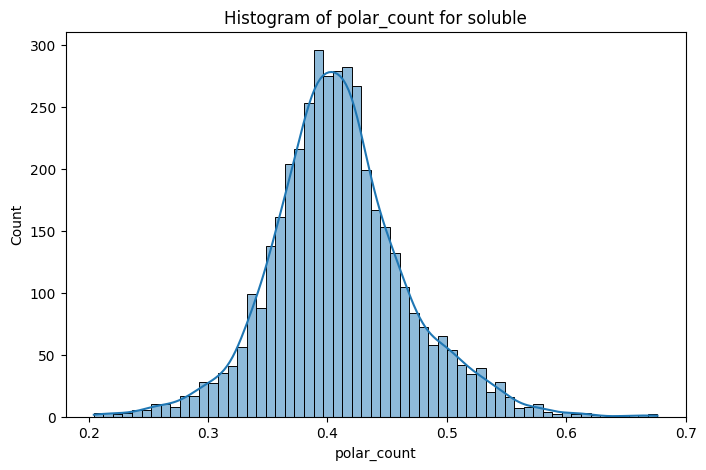

...

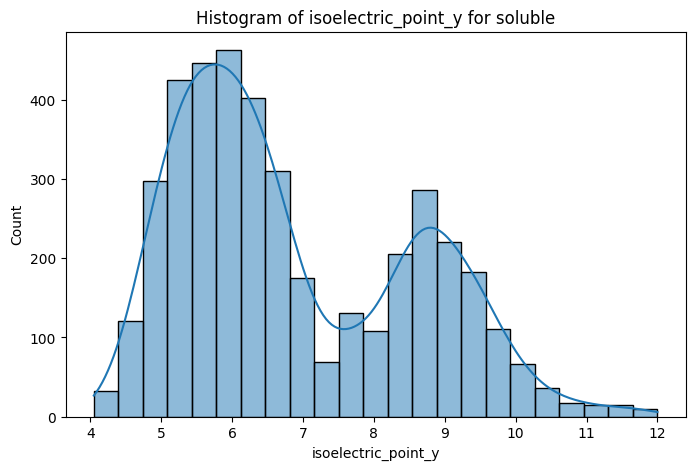

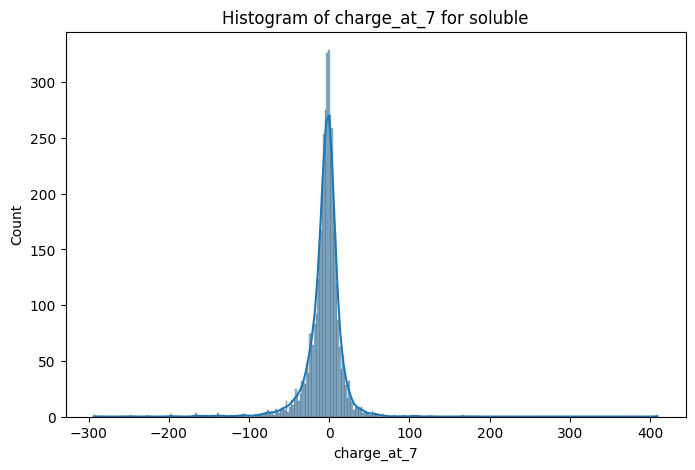

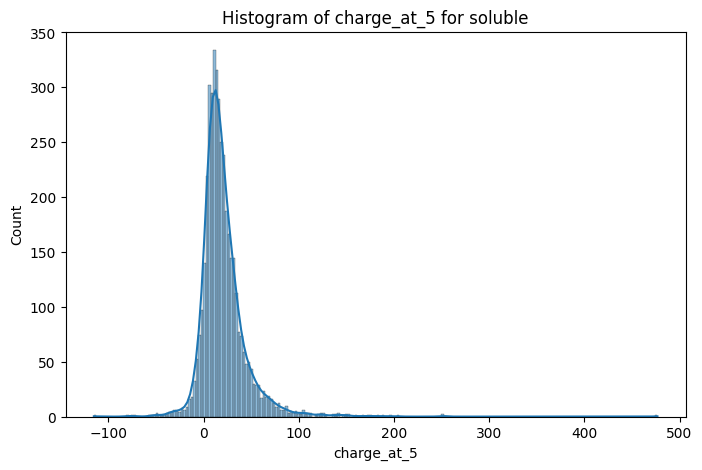

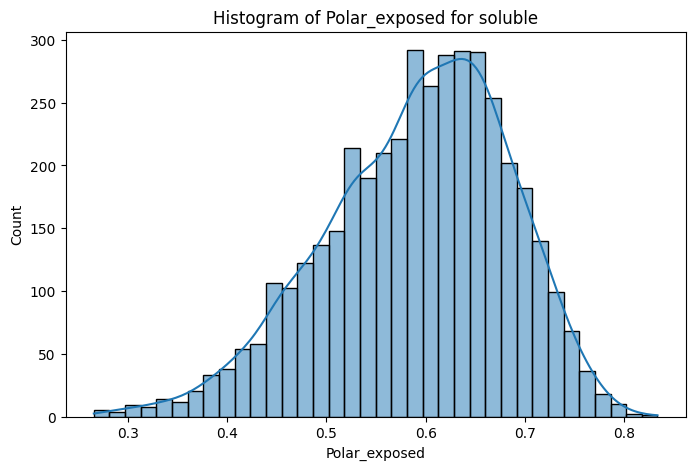

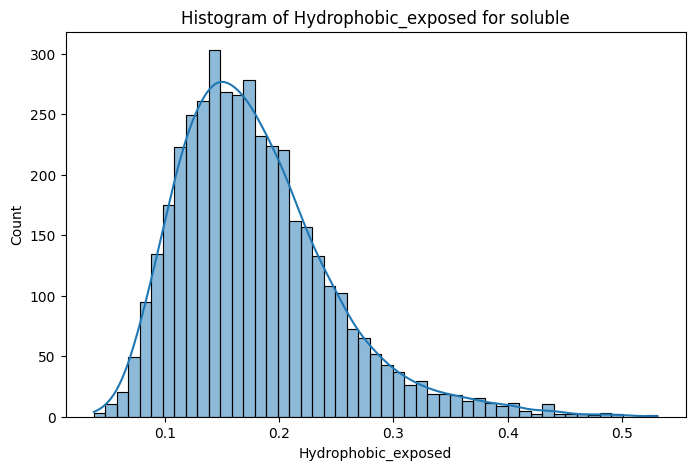

In [ ]:
# check for normality solubility based on visualisation
for feature in features:
    data_sol = data[data["set"] == "soluble"][feature]
    plt.figure(figsize=(8, 5))
    sns.histplot(data_sol, kde=True)
    plt.title(f"Histogram of {feature} for soluble")
    plt.show()

In [ ]:
# check for normaility aggregator based on visualisation
for feature in features:
    data_aggr = data[data["set"] == "aggregator"][feature]
    plt.figure(figsize=(8, 5))
    sns.histplot(data_aggr, kde=True)
    plt.title(f"Histogram of {feature} for aggregator")
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# TO DO:
# - correlation of the features wrt solubility -- done
# - proportion of categorical features
# - stratified data splitting

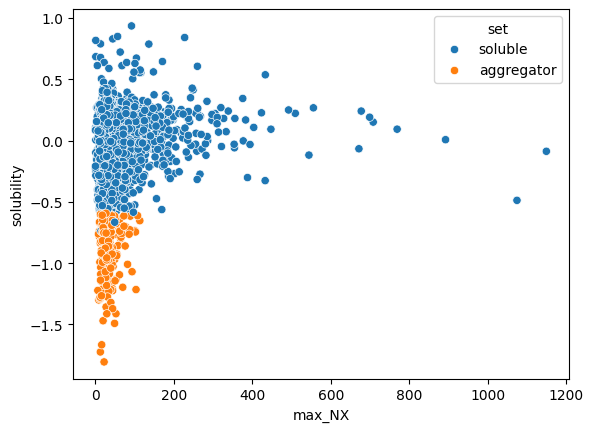

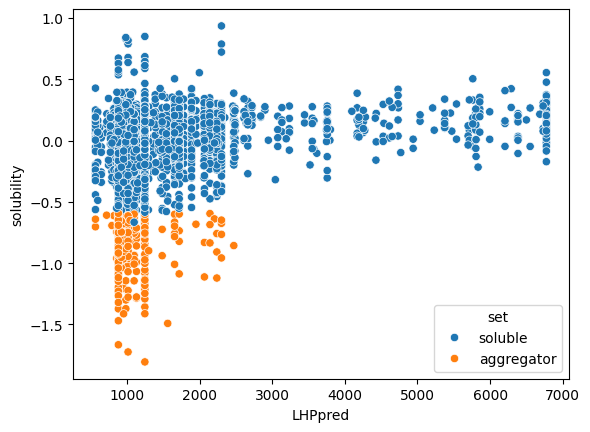

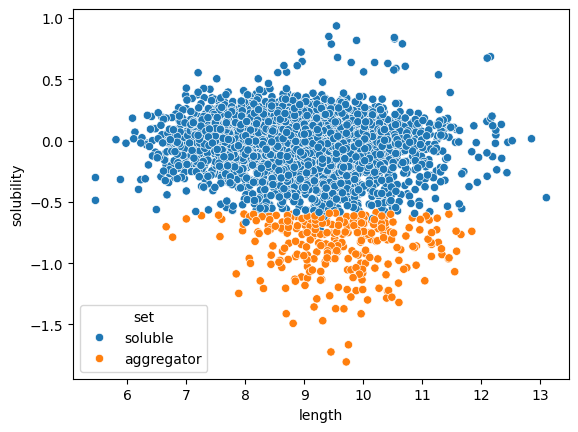

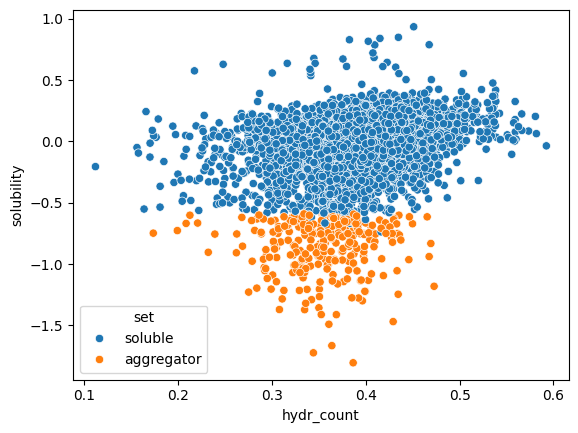

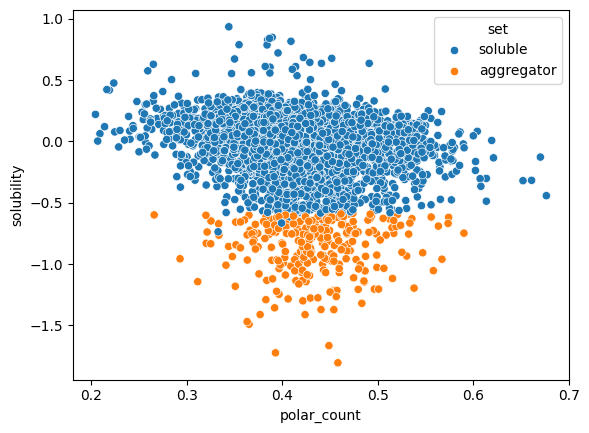

...

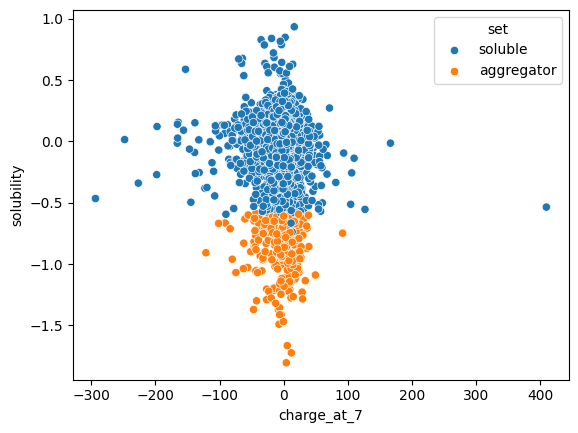

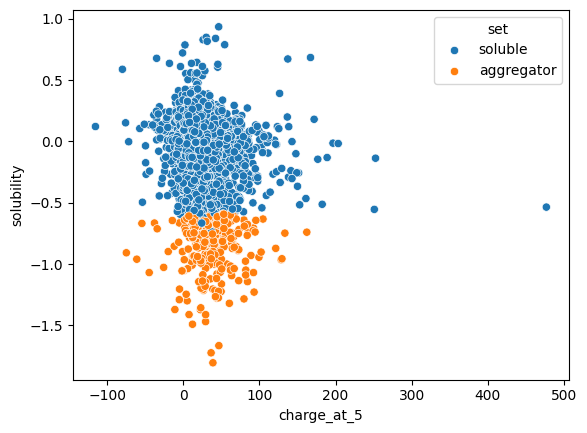

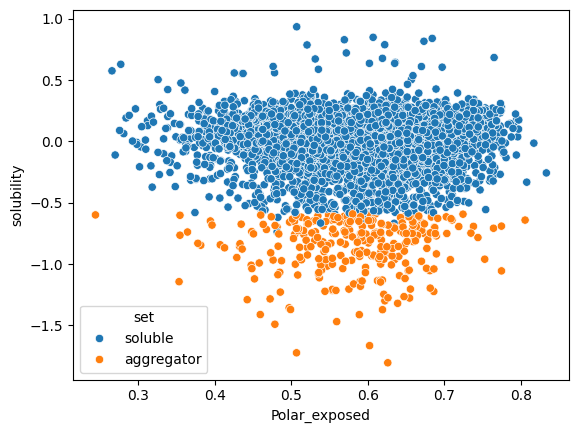

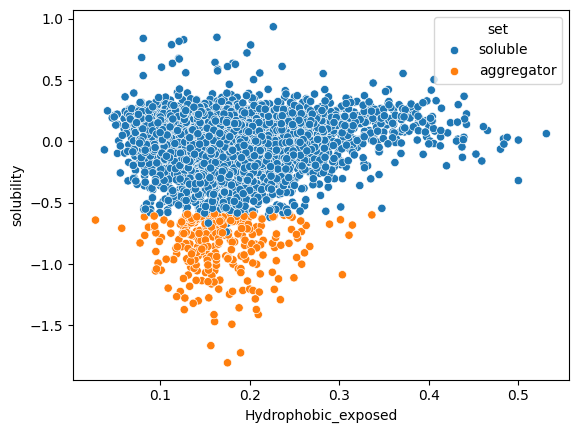

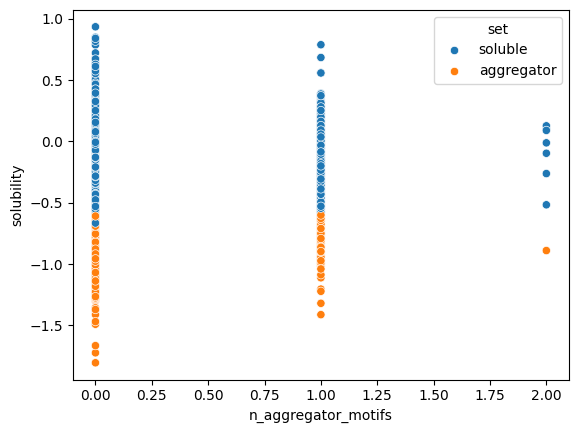

In [ ]:
# correlation of the features wrt solubility
for feature in features:
    sns.scatterplot(data=data, x=feature, y="solubility", hue="set")
    plt.show()

In [ ]:
cat_features = list(data.columns[6:])[60:-3]
print(cat_features)

['HSP', 'PTM_UP', 'Citrullination_UP', 'GPI-anchor_UP', 'Lipoprotein_UP', 'Nitration_UP', 'Prenylation_UP', 'ISGylation_UP', 'NEDDylation_UP', 'Acetylation_all', 'Glycosylation_all', 'Methylation_all', 'Myristoylation_all', 'Nitrosylation_all', 'Palmitoylation_all', 'Phosphorylation_all', 'SUMOylation_all', 'Ubiquitination_all', 'PTM_MSD', 'Phosphorylation_MSD', 'Glycosylation_MSD', 'Ubiquitination_MSD', 'SUMOylation_MSD', 'Acetylation_MSD', 'Palmitoylation_MSD', 'Methylation_MSD', 'coiled_coil', 'EGF', 'RAS_profile', 'RRM', 'ww_domain', 'transmembrane', 'TMHMM']


In [ ]:
# proportion of categorical features
prop_verb = True
for feature in cat_features:
    data_sol = data[data["set"] == "soluble"][feature]
    data_aggr = data[data["set"] == "aggregator"][feature]

    pos_sol = data_sol[data_sol == 1]
    prop_sol = len(pos_sol)/len(data_sol) * 100

    pos_aggr = data_aggr[data_aggr == 1]
    prop_aggr = len(pos_aggr)/len(data_aggr) * 100

    if abs(prop_sol - prop_aggr) > 10:
      print(f"Difference between sol and aggr: {abs(prop_sol - prop_aggr)} for feature {feature}")

    if prop_verb:
      print(f"Percentage {feature} of soluble == 1: {prop_sol}")
      print(f"Percentage {feature} of aggregator == 1: {prop_aggr}\n")

Percentage HSP of soluble == 1: 3.2359333494325044
Percentage HSP of aggregator == 1: 3.225806451612903

Percentage PTM_UP of soluble == 1: 87.53924172905096
Percentage PTM_UP of aggregator == 1: 96.05734767025089

Percentage Citrullination_UP of soluble == 1: 0.627867664815262
Percentage Citrullination_UP of aggregator == 1: 0.7168458781362007

Percentage GPI-anchor_UP of soluble == 1: 0.09659502535619416
Percentage GPI-anchor_UP of aggregator == 1: 0.0

Percentage Lipoprotein_UP of soluble == 1: 4.081139821299203
Percentage Lipoprotein_UP of aggregator == 1: 0.7168458781362007

Percentage Nitration_UP of soluble == 1: 0.5312726394590679
Percentage Nitration_UP of aggregator == 1: 0.35842293906810035

Percentage Prenylation_UP of soluble == 1: 1.521371649360058
Percentage Prenylation_UP of aggregator == 1: 0.0

Percentage ISGylation_UP of soluble == 1: 0.7727602028495533
Percentage ISGylation_UP of aggregator == 1: 0.0

Percentage NEDDylation_UP of soluble == 1: 0.28978507606858245
Pe

Percentages seem to be relatively similar, little difference in most categorical features. We could leave them out if this is the case. Some feature do differ a few percentages which indicates that the features might be relevant. Mostly relevant for classification I think?

In [ ]:
# select only the relevant features for further model testing here (different selection for classification or regression?)
# for regression:
corr_features = ["molecular_weight", "isoelectric_point_y", "thsa_netsurfp2", "tasa_netsurfp2", "Gravy", "P_exposed"]
regr_features = [i for i in features if i not in corr_features]
clas_features = regr_features + cat_features

print(regr_features)
print(clas_features)

['max_NX', 'LHPpred', 'length', 'hydr_count', 'polar_count', 'helix', 'turn', 'sheet', 'A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y', 'rhsa_netsurfp2', 'disorder', 'A_exposed', 'C_exposed', 'D_exposed', 'E_exposed', 'F_exposed', 'G_exposed', 'H_exposed', 'I_exposed', 'K_exposed', 'L_exposed', 'M_exposed', 'N_exposed', 'Q_exposed', 'R_exposed', 'S_exposed', 'T_exposed', 'V_exposed', 'W_exposed', 'Y_exposed', 'Aromaticity', 'Instability_index', 'charge_at_7', 'charge_at_5', 'Polar_exposed', 'Hydrophobic_exposed', 'n_aggregator_motifs']
['max_NX', 'LHPpred', 'length', 'hydr_count', 'polar_count', 'helix', 'turn', 'sheet', 'A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y', 'rhsa_netsurfp2', 'disorder', 'A_exposed', 'C_exposed', 'D_exposed', 'E_exposed', 'F_exposed', 'G_exposed', 'H_exposed', 'I_exposed', 'K_exposed', 'L_exposed', 'M_exposed', 'N_exposed', 'Q_exposed', 'R_exposed', 'S_expos

In [ ]:
from sklearn.model_selection import train_test_split

# assign data and the label (solubility or set)
X_solubility = data[regr_features]
y_solubility = data["solubility"]

X_set = data[clas_features]
y_set = data["set"]

# split data for solubility (80% train, 10% validation and 10% test)
X_sol_train, X_sol_test, y_sol_train, y_sol_test = train_test_split(X_solubility, y_solubility, test_size=0.2, random_state=42)
X_sol_train, X_sol_val, y_sol_train, y_sol_val = train_test_split(X_sol_train, y_sol_train, test_size=0.25, random_state=42)


# split data for set (80% train, 10% validation and 10% test)
X_set_train, X_set_test, y_set_train, y_set_test = train_test_split(X_set, y_set, test_size=0.2, random_state=42, stratify=y_set)
X_set_train, X_set_val, y_set_train, y_set_val = train_test_split(X_set_train, y_set_train, test_size=0.25, random_state=42, stratify=y_set_train)

In [ ]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error, accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler

oversampling = True
undersampling = False

# scaling
scaler = StandardScaler()
X_sol_train_scaled = scaler.fit_transform(X_sol_train)
X_sol_val_scaled = scaler.transform(X_sol_val)
X_sol_test_scaled = scaler.transform(X_sol_test)

X_set_train_scaled = scaler.fit_transform(X_set_train)
X_set_val_scaled = scaler.transform(X_set_val)
X_set_test_scaled = scaler.transform(X_set_test)

# oversampling (oversamples the aggregator class, end result is 2485 instances of each class)
if oversampling:
  oversampler = RandomOverSampler(random_state=42)
  print("Number of aggregators before oversampling:", len(y_set_train[y_set_train == "aggregator"]))
  X_set_train_scaled, y_set_train = oversampler.fit_resample(X_set_train_scaled, y_set_train)
  print("After oversampling:", len(y_set_train[y_set_train == "aggregator"]))
  print("Total after oversampling:", len(y_set_train))

if undersampling:
  undersampler = RandomUnderSampler(random_state=42)
  print("Number of solubles before undersampling:", len(y_set_train[y_set_train == "soluble"]))
  X_set_train_scaled, y_set_train = undersampler.fit_resample(X_set_train_scaled, y_set_train)
  print("After undersampling:", len(y_set_train[y_set_train == "soluble"]))
  print("Total after undersampling:", len(y_set_train))

Number of aggregators before oversampling: 167
After oversampling: 2485
Total after oversampling: 4970


In [ ]:
# linear regression for solubility prediction
solubility_model = LinearRegression()
solubility_model.fit(X_sol_train_scaled, y_sol_train)

# predict and evaluate the model on the validation set
solubility_val_predictions = solubility_model.predict(X_sol_val_scaled)
solubility_val_mse = mean_squared_error(y_sol_val, solubility_val_predictions)
print(f"Solubility validation Mean Squared Error: {solubility_val_mse}")

# logistic regression for set prediction
set_model = LogisticRegression(max_iter=1000) #this gives a convergence error for default max iters when oversampling
set_model.fit(X_set_train_scaled, y_set_train)

# predict and evaluate the model on the validation set
set_val_predictions = set_model.predict(X_set_val_scaled)
set_val_accuracy = accuracy_score(y_set_val, set_val_predictions)
print(f"Set validation accuracy: {set_val_accuracy}")

# additional evaluation metrics for classification
print("\nClassification report (validation set):")
print(classification_report(y_set_val, set_val_predictions))

print("\nConfusion matrix (validation set):")
print(confusion_matrix(y_set_val, set_val_predictions))

# predict and evaluate on the test set
solubility_test_predictions = solubility_model.predict(X_sol_test_scaled)
set_test_predictions = set_model.predict(X_set_test_scaled)
solubility_test_mse = mean_squared_error(y_sol_test, solubility_test_predictions)
set_test_accuracy = accuracy_score(y_set_test, set_test_predictions)

print(f"\nSolubility test Mean Squared Error: {solubility_test_mse}")
print(f"Set test Accuracy: {set_test_accuracy}")

# additional evaluation metrics for classification on the test set
print("\nClassification report (test set):")
print(classification_report(y_set_test, set_test_predictions))

print("\nConfusion matrix (test set):")
print(confusion_matrix(y_set_test, set_test_predictions))

Solubility validation Mean Squared Error: 0.07010925103836078
Set validation accuracy: 0.8076923076923077

Classification report (validation set):
              precision    recall  f1-score   support

  aggregator       0.20      0.68      0.31        56
     soluble       0.97      0.82      0.89       828

    accuracy                           0.81       884
   macro avg       0.59      0.75      0.60       884
weighted avg       0.93      0.81      0.85       884


Confusion matrix (validation set):
[[ 38  18]
 [152 676]]

Solubility test Mean Squared Error: 0.06434958913237589
Set test Accuracy: 0.8054298642533937

Classification report (test set):
              precision    recall  f1-score   support

  aggregator       0.19      0.62      0.29        56
     soluble       0.97      0.82      0.89       828

    accuracy                           0.81       884
   macro avg       0.58      0.72      0.59       884
weighted avg       0.92      0.81      0.85       884


Confusion

In [ ]:
print(len(clas_features))
print(len(regr_features))

89
56


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

# label encoding (soluble = 0 and aggregagtor = 1)
y_set_train.replace(["soluble", "aggregator"], [0, 1], inplace=True)
y_set_val.replace(["soluble", "aggregator"], [0, 1], inplace=True)
y_set_val_array = np.array(y_set_val)
y_set_test.replace(["soluble", "aggregator"], [0, 1], inplace=True)
y_set_test_array = np.array(y_set_test) # ValueError: could not determine the shape of object type 'Series' when not a numpy array, y_set_train had no issues?

# convert to pytorch tensors
X_set_train_tensor = torch.tensor(X_set_train_scaled, dtype=torch.float32)
y_set_train_tensor = torch.tensor(y_set_train, dtype=torch.float32).view(-1, 1)

X_set_val_tensor = torch.tensor(X_set_val_scaled, dtype=torch.float32)
y_set_val_tensor = torch.tensor(y_set_val_array, dtype=torch.float32).view(-1, 1)

X_set_test_tensor = torch.tensor(X_set_test_scaled, dtype=torch.float32)
y_set_test_tensor = torch.tensor(y_set_test_array, dtype=torch.float32).view(-1, 1)

In [ ]:
class NN_set_model(nn.Module):
    # currently has 2 hidden layers
    def __init__(self, input_size, hidden_size1, output_size):
        super(NN_set_model, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size1, output_size)
        self.sigmoid = nn.Sigmoid()
        nn.init.xavier_uniform_(self.fc1.weight)
        nn.init.xavier_uniform_(self.fc2.weight)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu1(x)
        x = self.fc2(x)
        x = self.sigmoid(x)
        return x

class NN_set_model2(nn.Module):
    def __init__(self, input_size, hidden_size1, hidden_size2, output_size):
        super(NN_set_model2, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size1, hidden_size2)
        self.relu2 = nn.ReLU()
        self.fc3 = nn.Linear(hidden_size2, output_size)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu1(x)
        x = self.fc2(x)
        x = self.relu2(x)
        x = self.fc3(x)
        x = self.sigmoid(x)
        return x

In [ ]:
from torch.utils.data import DataLoader, TensorDataset

# initiate model
batch_size = 16
input_size = X_set_train_scaled.shape[1]
hidden_size1 = 58
hidden_size2 = 32
output_size = 1
model = NN_set_model(input_size, hidden_size1, output_size)
# model = NN_set_model2(input_size, hidden_size1, hidden_size2, output_size)

# loss function and optimizer, BCE loss is best suited for binary classification instead of cross entropy (more suited for multi class)
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# convert data to PyTorch datasets and data loaders
train_dataset_set = TensorDataset(X_set_train_tensor, y_set_train_tensor)
val_dataset_set = TensorDataset(X_set_val_tensor, y_set_val_tensor)
test_dataset_set = TensorDataset(X_set_test_tensor, y_set_test_tensor)

train_loader_set = DataLoader(train_dataset_set, batch_size=batch_size, shuffle=True)
val_loader_set = DataLoader(val_dataset_set, batch_size=len(val_dataset_set), shuffle=False)
test_loader_set = DataLoader(test_dataset_set, batch_size=len(test_dataset_set), shuffle=False)

In [ ]:
# now we train the model
num_epochs = 100
accuracy_val_list = []

for epoch in range(1, num_epochs + 1):
  model.train()
  for inputs, labels in train_loader_set:
      optimizer.zero_grad()
      outputs = model(inputs)
      loss = criterion(outputs, labels)
      loss.backward()
      optimizer.step()

  # evaluate the model with the validation dataset
  model.eval()
  with torch.no_grad():
      val_outputs = model(X_set_val_tensor)
      val_predictions = (val_outputs > 0.5).float()
  accuracy_val = accuracy_score(y_set_val_tensor, val_predictions.numpy())
  accuracy_val_list.append(accuracy_val)
  if epoch % 10 == 0:
    print(f"Epoch {epoch}/{num_epochs}, validation accuracy: {accuracy_val}")

# evaluate the final model on the test set
model.eval()
with torch.no_grad():
    test_outputs = model(X_set_test_tensor)
    test_predictions = (test_outputs > 0.5).float()
accuracy_test = accuracy_score(y_set_test_tensor, test_predictions.numpy())
print(f"\nFinal test accuracy: {accuracy_test}")

# classification report and confusion matrix
print("\nClassification report (test sSet):")
print(classification_report(y_set_test_tensor, test_predictions.numpy()))

print("\nConfusion matrix (test set):")
print(confusion_matrix(y_set_test_tensor, test_predictions.numpy()))

# Confusion matrix:
# [[True Negative  False Positive]
#  [False Negative True Positive]]

Epoch 10/100, validation accuracy: 0.8416289592760181
Epoch 20/100, validation accuracy: 0.8687782805429864
Epoch 30/100, validation accuracy: 0.8823529411764706
Epoch 40/100, validation accuracy: 0.8959276018099548
Epoch 50/100, validation accuracy: 0.9015837104072398
Epoch 60/100, validation accuracy: 0.8981900452488688
Epoch 70/100, validation accuracy: 0.9027149321266968
Epoch 80/100, validation accuracy: 0.9038461538461539
Epoch 90/100, validation accuracy: 0.9095022624434389
Epoch 100/100, validation accuracy: 0.9128959276018099

Final test accuracy: 0.919683257918552

Classification report (test sSet):
              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96       828
         1.0       0.36      0.36      0.36        56

    accuracy                           0.92       884
   macro avg       0.66      0.66      0.66       884
weighted avg       0.92      0.92      0.92       884


Confusion matrix (test set):
[[793  35]
 [ 36  20]]


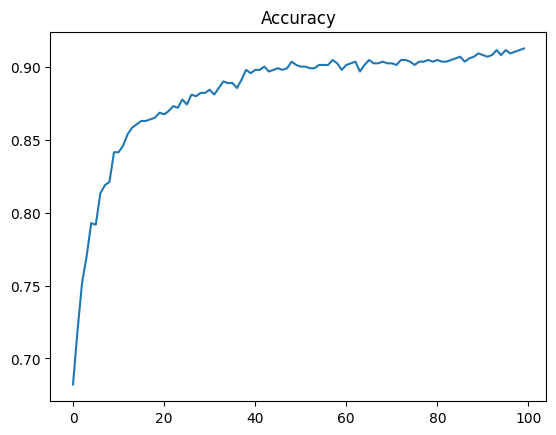

In [ ]:
# plot the validation accuracy to check the how the model learns
plt.plot(range(num_epochs), accuracy_val_list)
plt.title("Accuracy")
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# label encoding (soluble = 0 and aggregagtor = 1)
y_sol_train.replace(["soluble", "aggregator"], [0, 1], inplace=True)
y_sol_val.replace(["soluble", "aggregator"], [0, 1], inplace=True)
y_sol_val_array = np.array(y_sol_val)
y_sol_test.replace(["soluble", "aggregator"], [0, 1], inplace=True)
y_sol_test_array = np.array(y_sol_test) # ValueError: could not determine the shape of object type 'Series' when not a numpy array, y_sol_train had no issues?

# convert to pytorch tensors
X_sol_train_tensor = torch.tensor(X_sol_train_scaled, dtype=torch.float32)
y_sol_train_tensor = torch.tensor(y_sol_train, dtype=torch.float32).view(-1, 1)

X_sol_val_tensor = torch.tensor(X_sol_val_scaled, dtype=torch.float32)
y_sol_val_tensor = torch.tensor(y_sol_val_array, dtype=torch.float32).view(-1, 1)

X_sol_test_tensor = torch.tensor(X_sol_test_scaled, dtype=torch.float32)
y_sol_test_tensor = torch.tensor(y_sol_test_array, dtype=torch.float32).view(-1, 1)

# Define the sol model
class NN_sol_model(nn.Module):
    def __init__(self, input_size, hidden_size1, output_size):
        super(NN_sol_model, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size1, output_size)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu1(x)
        x = self.fc2(x)
        return x

class NN_sol_model2(nn.Module):
    def __init__(self, input_size, hidden_size1, hidden_size2, output_size):
        super(NN_sol_model2, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size1, hidden_size2)
        self.relu2 = nn.ReLU()
        self.fc3 = nn.Linear(hidden_size2, output_size)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu1(x)
        x = self.fc2(x)
        x = self.relu2(x)
        x = self.fc3(x)
        return x

# initiate the sol model
batch_size_sol = 16
sol_input_size = 55
sol_hidden_size1 = 36
sol_hidden_size2 = 36
sol_output_size = 1
sol_model = NN_sol_model2(sol_input_size, sol_hidden_size1, sol_hidden_size2, sol_output_size)
criterion_sol = nn.MSELoss()
optimizer_sol = optim.Adam(sol_model.parameters(), lr=0.00001)

# Convert data to PyTorch datasets and data loaders for sol
train_dataset_sol = TensorDataset(X_sol_train_tensor, y_sol_train_tensor)
val_dataset_sol = TensorDataset(X_sol_val_tensor, y_sol_val_tensor)
test_dataset_sol = TensorDataset(X_sol_test_tensor, y_sol_test_tensor)

train_loader_sol = DataLoader(train_dataset_sol, batch_size=batch_size_sol, shuffle=True)
val_loader_sol = DataLoader(val_dataset_sol, batch_size=len(val_dataset_sol), shuffle=False)
test_loader_sol = DataLoader(test_dataset_sol, batch_size=len(test_dataset_sol), shuffle=False)

# Training loop for sol model
num_epochs_sol = 500
loss_list_sol = []
r2_list = []

for epoch in range(1, num_epochs_sol + 1):
    sol_model.train()
    for inputs, targets in train_loader_sol:
        optimizer_sol.zero_grad()
        outputs_sol = sol_model(inputs)
        loss_sol = criterion_sol(outputs_sol, targets)
        loss_list_sol.append(loss_sol.item())
        loss_sol.backward()
        optimizer_sol.step()

    # Evaluation on the validation set
    sol_model.eval()
    with torch.no_grad():
        val_outputs_sol = sol_model(X_sol_val_tensor)
    r2_val = r2_score(y_sol_val_tensor.numpy(), val_outputs_sol.numpy())
    r2_list.append(r2_val)

    if epoch % 10 == 0:
        print(f"Epoch {epoch}/{num_epochs_sol}, R^2 score on validation set: {r2_val}")

# Evaluation on the test set
sol_model.eval()
with torch.no_grad():
    test_outputs_sol = sol_model(X_sol_test_tensor)
mse_test = mean_squared_error(y_sol_test_tensor.numpy(), test_outputs_sol.numpy())
r2_test = r2_score(y_sol_test_tensor.numpy(), test_outputs_sol.numpy())

print(f"\nFinal test mean squared error: {mse_test}")
print(f"Final test R^2 score: {r2_test}")

Epoch 10/500, R^2 score on validation set: 0.02451793186861284
Epoch 20/500, R^2 score on validation set: 0.12565644527169917
Epoch 30/500, R^2 score on validation set: 0.15087564971201972
Epoch 40/500, R^2 score on validation set: 0.1639275996388282
Epoch 50/500, R^2 score on validation set: 0.1734398744277037
Epoch 60/500, R^2 score on validation set: 0.18078131773056438
Epoch 70/500, R^2 score on validation set: 0.18734015763569678
Epoch 80/500, R^2 score on validation set: 0.19290313599934028
Epoch 90/500, R^2 score on validation set: 0.19744880443038015
Epoch 100/500, R^2 score on validation set: 0.20144054332141792
Epoch 110/500, R^2 score on validation set: 0.20498617135290464
Epoch 120/500, R^2 score on validation set: 0.20800836150260482
Epoch 130/500, R^2 score on validation set: 0.21043929184136656
Epoch 140/500, R^2 score on validation set: 0.21276010339762907
Epoch 150/500, R^2 score on validation set: 0.2148734635718419
Epoch 160/500, R^2 score on validation set: 0.216642

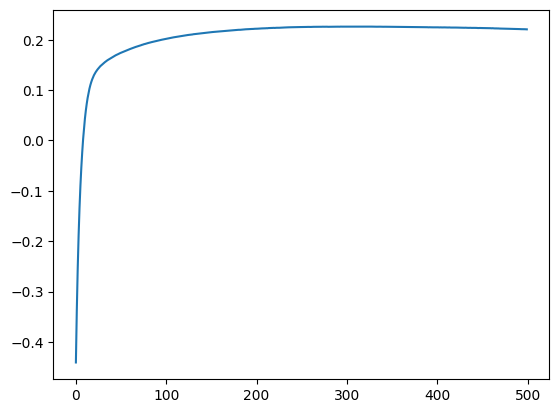

In [ ]:
plt.plot(range(num_epochs_sol), r2_list)
plt.show()

Oversampling results in a good accuracy (>0.9), but lot's of false negatives, undersampling reduces the false negatives but also reduces the accuracy. Regression of the solubility is bad overal, R^2 score is only around ~0.2

# KNN

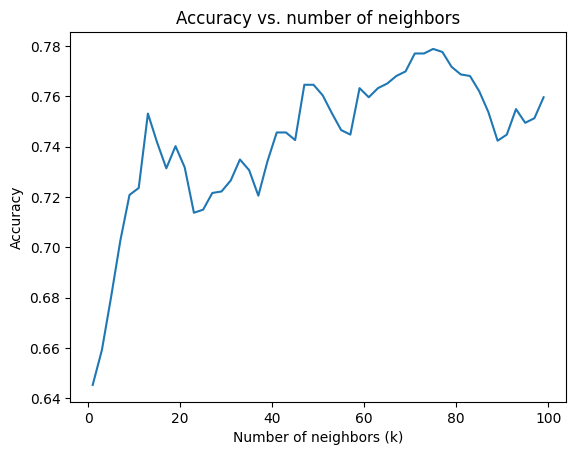

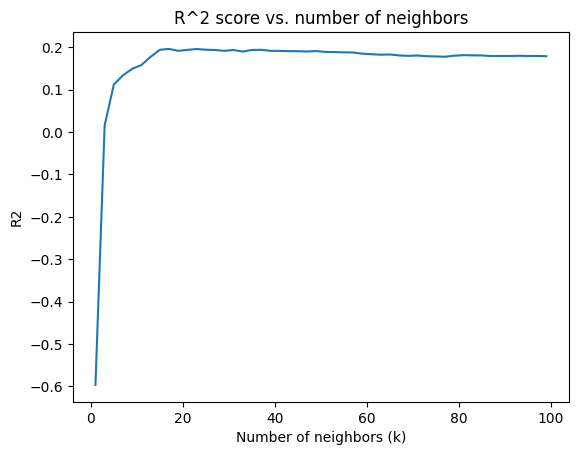

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import r2_score

knn_verbose = False
k_set_acc = []
k_sol_r2 = []
k_values = range(1, 100, 2)

for k in k_values:
  # KNN for set (classification)
  # train KNN model
  knn_set = KNeighborsClassifier(n_neighbors=k)
  knn_set.fit(X_set_train_scaled, y_set_train)

  y_set_pred = knn_set.predict(X_set_val_scaled)

  # evaluate model
  accuracy = balanced_accuracy_score(y_set_val, y_set_pred)
  classification_rep = classification_report(y_set_val, y_set_pred)
  conf_matrix = confusion_matrix(y_set_val, y_set_pred)
  k_set_acc.append(accuracy)

  if knn_verbose:
    print("Classification:")
    print(f"Accuracy: {accuracy}")
    print("Classification report:")
    print(classification_rep)
    print("Confusion matrix:")
    print(conf_matrix, "\n")

  # KNN for solubility (regression)
  knn_sol = KNeighborsRegressor(n_neighbors=k)
  knn_sol.fit(X_sol_train_scaled, y_sol_train)

  y_sol_pred = knn_sol.predict(X_sol_val_scaled)

  # evaluate model
  mse = mean_squared_error(y_sol_val, y_sol_pred)
  r2 = r2_score(y_sol_val, y_sol_pred)
  k_sol_r2.append(r2)

  if knn_verbose:
    print("Regression:")
    print(f"Mean Squared Error: {mse}")
    print(f"R^2 score: {r2}")

# for set
plt.plot(k_values, k_set_acc)
plt.xlabel('Number of neighbors (k)')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. number of neighbors')
plt.show()

# for sol
plt.plot(k_values, k_sol_r2)
plt.xlabel('Number of neighbors (k)')
plt.ylabel('R2')
plt.title('R^2 score vs. number of neighbors')
plt.show()

# Random Forest

Import necessary libraries

In [ ]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from scipy.stats import randint

# Tree Visualisation
from sklearn.tree import export_graphviz
from IPython.display import Image
import graphviz


Import and pre-process the data. This is the same as for previous steps but done again to make sure we're working from scratch and dropping the empty instance.


In [ ]:
file_path = "/content/drive/My Drive/scMachine_Learning/Aggr_sol_dataset/Data/aggr_sol_dataset.csv"
df_aggr_sol = pd.read_csv(file_path)
df_aggr_sol = df_aggr_sol.drop(2478)

Select numeric columns, mean center, scale

In [ ]:
non_numeric_columns = df_aggr_sol.select_dtypes(exclude=["number"]).columns
df_aggr_sol_n = df_aggr_sol.drop(["set", "solubility", "Gene", "Gene_name", "Uniprot_ID"] + list(non_numeric_columns), axis=1)
df_aggr_sol_n_c = df_aggr_sol_n.sub(df_aggr_sol_n.mean(axis=0), axis=1)
df_aggr_sol_n_cs = df_aggr_sol_n_c.div(df_aggr_sol_n_c.std(axis=0),axis=1)

Append target variable ("set") to centered and scaled dataframe, code it as a binary class with 0 for aggregator and 1 for soluble:

In [ ]:
df_aggr_sol_n_cs_rf_set = pd.concat([df_aggr_sol_n_cs, df_aggr_sol['set']], axis=1)
df_aggr_sol_n_cs_rf_set['set'] = df_aggr_sol_n_cs_rf_set['set'].map({'aggregator':0,'soluble':1})
print(df_aggr_sol_n_cs_rf_set['set'].value_counts())

1    4141
0     279
Name: set, dtype: int64


Using all features:

In [ ]:
X_set = df_aggr_sol_n_cs_rf_set.drop(columns='set')
y_set = df_aggr_sol_n_cs_rf_set['set']

# split data for set (80% train, 10% validation and 10% test)
X_set_train, X_set_test, y_set_train, y_set_test = train_test_split(X_set, y_set, test_size=0.2, random_state=42, stratify=y_set)
X_set_train, X_set_val, y_set_train, y_set_val = train_test_split(X_set_train, y_set_train, test_size=0.25, random_state=42, stratify=y_set_train)

Build the model

In [ ]:
rf_set = RandomForestClassifier()

rf_set.fit(X_set_train, y_set_train)
y_set_pred = rf_set.predict(X_set_test)

accuracy_set = accuracy_score(y_set_test, y_set_pred)
print("Accuracy:", accuracy_set)

Accuracy: 0.9366515837104072


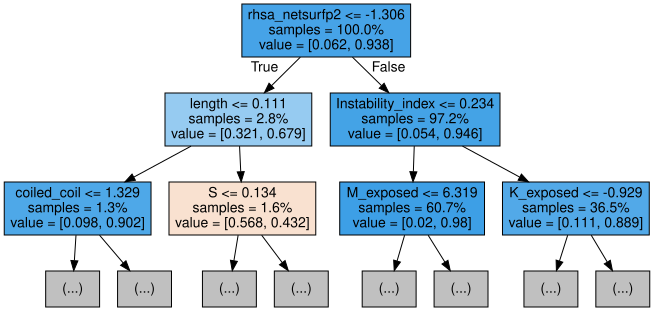

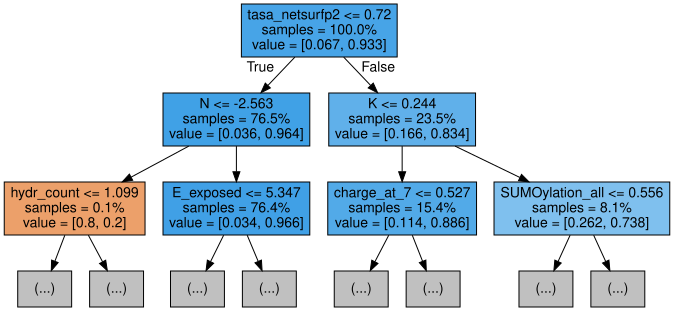

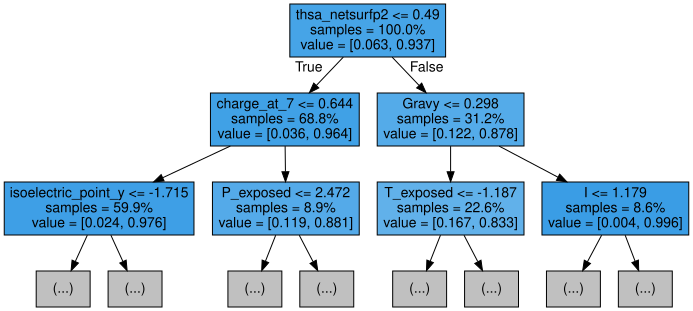

In [ ]:
# Export the first three decision trees from the forest

for i in range(3):
    tree = rf_set.estimators_[i]
    dot_data = export_graphviz(tree,
                               feature_names=X_set_train.columns,
                               filled=True,
                               max_depth=2,
                               impurity=False,
                               proportion=True)
    graph = graphviz.Source(dot_data)
    display(graph)

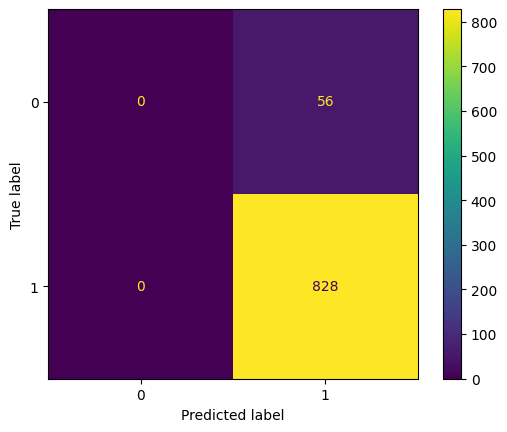

In [ ]:
cm = confusion_matrix(y_set_test, y_set_pred)

ConfusionMatrixDisplay(confusion_matrix=cm).plot();